In [1]:
import pandas as pd

df=pd.read_csv('BankChurners.csv')

In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 23 columns):
 #   Column                                                                                                                              Non-Null Count  Dtype  
---  ------                                                                                                                              --------------  -----  
 0   CLIENTNUM                                                                                                                           10127 non-null  int64  
 1   Attrition_Flag                                                                                                                      10127 non-null  object 
 2   Customer_Age                                                                                                                        10127 non-null  int64  
 3   Gender                                                                           

In [3]:
df.drop(['Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
         'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'],
        axis=1 , inplace =True)

In [4]:
df

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,...,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,710638233,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,...,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,...,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,717406983,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,...,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


## EDA

In [5]:
import plotly.graph_objects as go
import plotly.express as px
import matplotlib.pyplot as plt
import numpy as np
from plotly.subplots import make_subplots

In [6]:
a=pd.DataFrame(df['Attrition_Flag'].value_counts())

In [7]:
fig = go.Figure(data=[go.Pie(labels=a.index, values=a.Attrition_Flag)])
fig.update_layout(title_text="Churned Customers")
fig.show()

### Income Category

In [8]:
att_inc=df.groupby(['Attrition_Flag','Income_Category']).Income_Category.count().unstack()
print(att_inc)

Income_Category    $120K +  $40K - $60K  $60K - $80K  $80K - $120K  \
Attrition_Flag                                                       
Attrited Customer      126          271          189           242   
Existing Customer      601         1519         1213          1293   

Income_Category    Less than $40K  Unknown  
Attrition_Flag                              
Attrited Customer             612      187  
Existing Customer            2949      925  


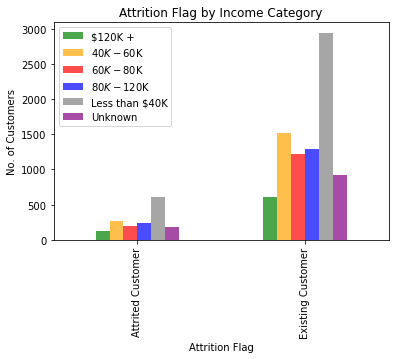

In [9]:
fig=att_inc.plot(kind='bar',title='Attrition Flag by Income Category',color = ['green','orange','red','blue','grey','purple'], alpha = .70)
fig.set_xlabel('Attrition Flag')
fig.set_ylabel('No. of Customers')
fig.legend(['$120K +','$40K - $60K','$60K - $80K','$80K - $120K','Less than $40K','Unknown'])
plt.show()

In [10]:
att_cus = df.loc[df['Attrition_Flag']== 'Attrited Customer']
ext_cus = df.loc[df['Attrition_Flag']== 'Existing Customer']

In [11]:
specs = [[{'type':'pie'}, {'type':'pie'}]]
fig = make_subplots(rows=1, cols=2, specs=specs,subplot_titles=['Attrited Customer','Existing Customer'])

In [12]:
from collections import Counter
cnt = Counter(att_cus['Income_Category'])
perct = [(i, cnt[i] / len(att_cus['Income_Category']) * 100.0) for i in cnt]
new = pd.DataFrame(perct)
att_cus_inc = new.rename(columns={ 0 :'Income_Category', 1:'Percentage'})

In [13]:
from collections import Counter
cnt = Counter(ext_cus['Income_Category'])
perct = [(i, cnt[i] / len(ext_cus['Income_Category']) * 100.0) for i in cnt]
new = pd.DataFrame(perct)
ext_cus_inc = new.rename(columns={ 0 :'Income_Category', 1:'Percentage'})

In [14]:
fig.add_trace(go.Pie(labels=att_cus_inc['Income_Category'], values=att_cus_inc['Percentage'],name='No. of Customers'),1,1)
fig.add_trace(go.Pie(labels=ext_cus_inc['Income_Category'], values=ext_cus_inc['Percentage'],name='No. of Customers'),1,2)
fig=go.Figure(fig)
fig.update_layout(title_text='Income Category Distribution by Attrition')
fig.show()

### Education Level 

In [15]:
att_edu=df.groupby(['Attrition_Flag','Education_Level']).Education_Level.count().unstack()
print(att_edu)

Education_Level    College  Doctorate  Graduate  High School  Post-Graduate  \
Attrition_Flag                                                                
Attrited Customer      154         95       487          306             92   
Existing Customer      859        356      2641         1707            424   

Education_Level    Uneducated  Unknown  
Attrition_Flag                          
Attrited Customer         237      256  
Existing Customer        1250     1263  


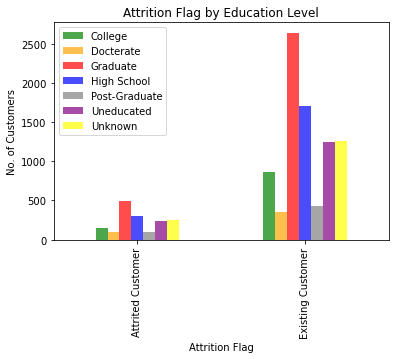

In [16]:
fig=att_edu.plot(kind='bar',title='Attrition Flag by Education Level',color = ['green','orange','red','blue','grey','purple','yellow'], alpha = .70)
fig.set_xlabel('Attrition Flag')
fig.set_ylabel('No. of Customers')
fig.legend(['College','Docterate','Graduate','High School','Post-Graduate','Uneducated','Unknown'])
plt.show()

In [17]:
from collections import Counter
cnt = Counter(att_cus['Education_Level'])
perct = [(i, cnt[i] / len(att_cus['Education_Level']) * 100.0) for i in cnt]
new = pd.DataFrame(perct)
att_cus_edu = new.rename(columns={ 0 :'Education_Level', 1:'Percentage'})

In [18]:
from collections import Counter
cnt = Counter(ext_cus['Education_Level'])
perct = [(i, cnt[i] / len(ext_cus['Education_Level']) * 100.0) for i in cnt]
new = pd.DataFrame(perct)
ext_cus_edu = new.rename(columns={ 0 :'Education_Level', 1:'Percentage'})

In [19]:
specs = [[{'type':'pie'}, {'type':'pie'}]]
fig = make_subplots(rows=1, cols=2, specs=specs,subplot_titles=['Attrited Customer','Existing Customer'])
fig.add_trace(go.Pie(labels=att_cus_edu['Education_Level'], values=att_cus_edu['Percentage'],name='No. of Customers'),1,1)
fig.add_trace(go.Pie(labels=ext_cus_edu['Education_Level'], values=ext_cus_edu['Percentage'],name='No. of Customers'),1,2)
fig=go.Figure(fig)
fig.update_layout(title_text='Education Level Distribution by Attrition')
fig.show()

In [20]:
att_card=df.groupby(['Attrition_Flag','Card_Category']).Card_Category.count().unstack()
print(att_card)

Card_Category      Blue  Gold  Platinum  Silver
Attrition_Flag                                 
Attrited Customer  1519    21         5      82
Existing Customer  7917    95        15     473


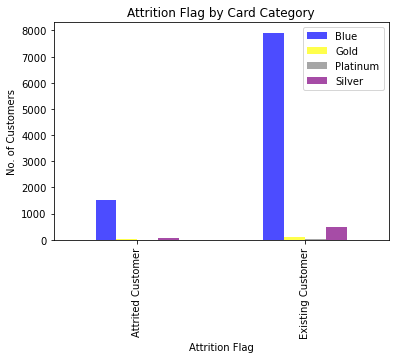

In [21]:
fig=att_card.plot(kind='bar',title='Attrition Flag by Card Category',color = ['blue','yellow','grey','purple'], alpha = .70)
fig.set_xlabel('Attrition Flag')
fig.set_ylabel('No. of Customers')
fig.legend(['Blue','Gold','Platinum','Silver'])
plt.show()

In [22]:
from collections import Counter
cnt = Counter(att_cus['Card_Category'])
perct = [(i, cnt[i] / len(att_cus['Card_Category']) * 100.0) for i in cnt]
new = pd.DataFrame(perct)
att_cus_card = new.rename(columns={ 0 :'Card_Category', 1:'Percentage'})

In [23]:
from collections import Counter
cnt = Counter(ext_cus['Card_Category'])
perct = [(i, cnt[i] / len(ext_cus['Card_Category']) * 100.0) for i in cnt]
new = pd.DataFrame(perct)
ext_cus_card = new.rename(columns={ 0 :'Card_Category', 1:'Percentage'})

In [24]:
specs = [[{'type':'pie'}, {'type':'pie'}]]
fig = make_subplots(rows=1, cols=2, specs=specs,subplot_titles=['Attrited Customer','Existing Customer'])
fig.add_trace(go.Pie(labels=att_cus_card['Card_Category'], values=att_cus_card['Percentage'],name='No. of Customers'),1,1)
fig.add_trace(go.Pie(labels=ext_cus_card['Card_Category'], values=ext_cus_card['Percentage'],name='No. of Customers'),1,2)
fig=go.Figure(fig)
fig.update_layout(title_text='Card Category Distribution by Attrition')
fig.show()

## PyCaret 

In [25]:
from pycaret.classification import *
classification = setup(data=df,target='Attrition_Flag',train_size=0.8)

,Description,Value
0,session_id,3295
1,Target,Attrition_Flag
2,Target Type,Binary
3,Label Encoded,"Attrited Customer: 0, Existing Customer: 1"
4,Original Data,"(10127, 21)"
5,Missing Values,False
6,Numeric Features,11
7,Categorical Features,9
8,Ordinal Features,False
9,High Cardinality Features,False


In [26]:
best=compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
catboost,CatBoost Classifier,0.9733,0.9939,0.9913,0.9772,0.9842,0.8988,0.9001,3.8860
lightgbm,Light Gradient Boosting Machine,0.9705,0.9929,0.9861,0.9788,0.9825,0.8896,0.8902,0.2450
xgboost,Extreme Gradient Boosting,0.9696,0.9920,0.9859,0.9781,0.9820,0.8863,0.8869,1.5730
gbc,Gradient Boosting Classifier,0.9636,0.9885,0.9885,0.9687,0.9785,0.8599,0.8621,0.7030
ada,Ada Boost Classifier,0.9548,0.9838,0.9813,0.9654,0.9733,0.8275,0.8291,0.2120
rf,Random Forest Classifier,0.9501,0.9841,0.9897,0.9527,0.9708,0.8001,0.8076,0.4690
dt,Decision Tree Classifier,0.9349,0.8784,0.9621,0.9604,0.9612,0.7597,0.7605,0.0420
et,Extra Trees Classifier,0.9219,0.9664,0.9907,0.9219,0.9550,0.6593,0.6859,0.4420
lda,Linear Discriminant Analysis,0.9136,0.9300,0.9664,0.9329,0.9493,0.6566,0.6620,0.0560
ridge,Ridge Classifier,0.9056,0.0000,0.9859,0.9091,0.9459,0.5784,0.6102,0.0780


In [27]:
lgb = create_model('lightgbm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9753,0.9945,0.9823,0.9881,0.9852,0.9106,0.9108
1,0.9630,0.9914,0.9809,0.9751,0.9780,0.8617,0.8618
2,0.9728,0.9913,0.9897,0.9782,0.9839,0.8973,0.8979
3,0.9728,0.9934,0.9823,0.9852,0.9838,0.9004,0.9005
4,0.9630,0.9953,0.9838,0.9723,0.9780,0.8600,0.8606
5,0.9716,0.9954,0.9853,0.9809,0.9831,0.8943,0.8944
6,0.9741,0.9957,0.9853,0.9838,0.9845,0.9047,0.9047
7,0.9654,0.9843,0.9882,0.9710,0.9795,0.8685,0.8699
8,0.9691,0.9937,0.9926,0.9711,0.9818,0.8814,0.8837
9,0.9778,0.9943,0.9912,0.9825,0.9868,0.9170,0.9174


In [28]:
'''
# compare all baseline models and select top 5
top5 = compare_models(n_select = 5) 
# tune top 5 base models
tuned_top5 = [tune_model(i) for i in top5]
# ensemble top 5 tuned models
bagged_top5 = [ensemble_model(i) for i in tuned_top5]
# blend top 5 base models 
blender = blend_models(estimator_list = top5) 
# select best model 
best = automl(optimize = 'Recall')
'''

"\n# compare all baseline models and select top 5\ntop5 = compare_models(n_select = 5) \n# tune top 5 base models\ntuned_top5 = [tune_model(i) for i in top5]\n# ensemble top 5 tuned models\nbagged_top5 = [ensemble_model(i) for i in tuned_top5]\n# blend top 5 base models \nblender = blend_models(estimator_list = top5) \n# select best model \nbest = automl(optimize = 'Recall')\n"

In [29]:
#plot_model(best)

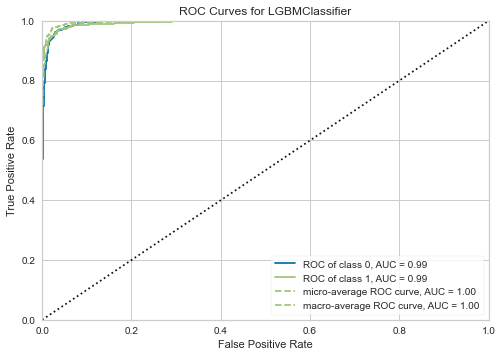

In [30]:
plot_model(lgb)

In [31]:
evaluate_model(lgb)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

## Neural Network

In [33]:
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

Using TensorFlow backend.


In [43]:
# Create Label
y=df['Attrition_Flag']

In [44]:
# Create Attribute
x=df.drop(['Attrition_Flag','CLIENTNUM'],axis=1)

In [49]:
# Encode Label - 0,1 array
encoder=LabelEncoder()
encoder.fit(y)
encoded_y = encoder.transform(y)

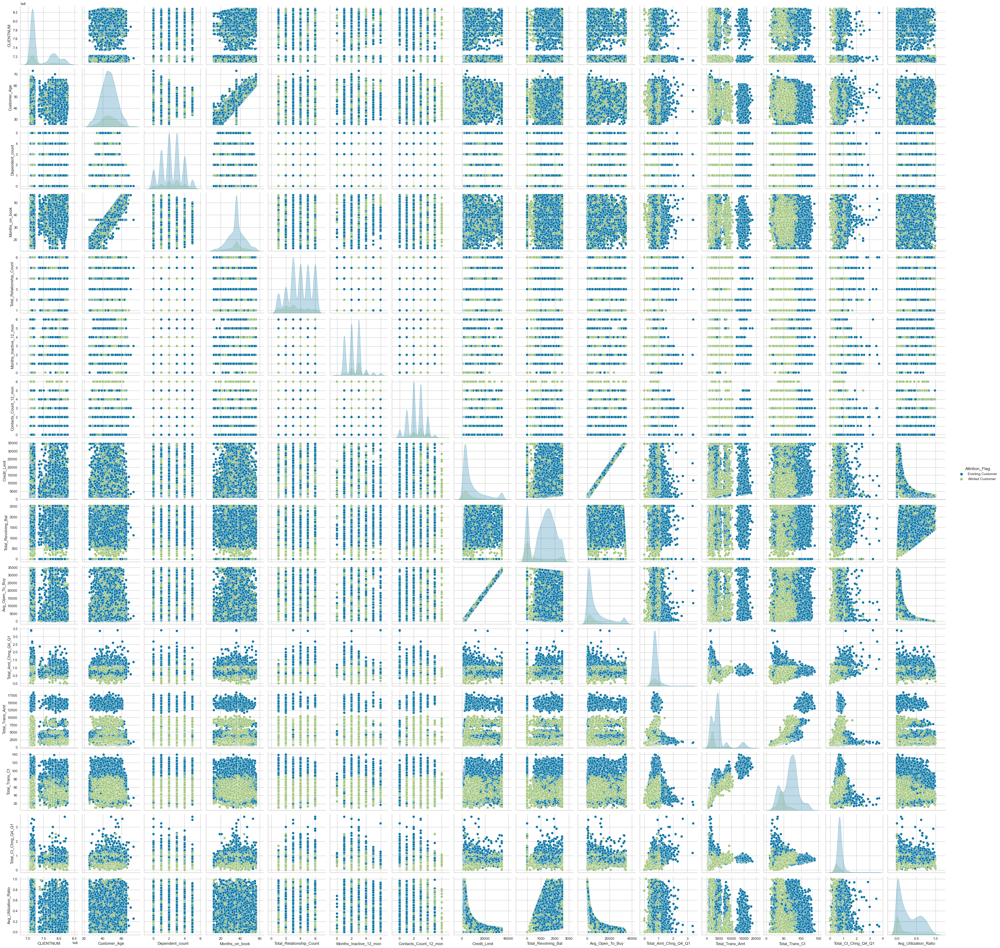

In [53]:
import seaborn as sns
sns.pairplot(df, hue='Attrition_Flag')

<AxesSubplot:>

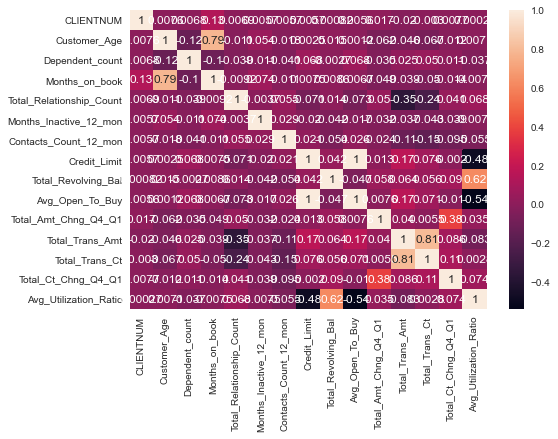

In [54]:
sns.heatmap(df.corr(),annot=True)

In [59]:
# Encoding
x['Gender']=encoder.fit_transform(x['Gender'])
x['Education_Level']=encoder.fit_transform(x['Education_Level'])
x['Marital_Status']=encoder.fit_transform(x['Marital_Status'])
x['Income_Category']=encoder.fit_transform(x['Income_Category'])
x['Card_Category']=encoder.fit_transform(x['Card_Category'])

In [62]:
# Standardizing
scaler=StandardScaler()
X=scaler.fit_transform(x)

In [77]:
# Train Test Split
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,encoded_y,test_size=0.2)

In [86]:
# Create Model
model=Sequential()

# Input layer Layer
model.add(Dense(32,activation='relu',input_dim=19))

# Hidden Layer
model.add(Dense(16,activation='relu'))

# Outout Layer
model.add(Dense(1,activation='sigmoid'))

model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])

In [87]:
# Fit model
model.fit(X_train,y_train,batch_size=10,epochs=100)

Epoch 1/100
8101/8101 [==============================] - 2s 271us/step - loss: 0.2898 - accuracy: 0.8862
Epoch 2/100
8101/8101 [==============================] - 1s 71us/step - loss: 0.2136 - accuracy: 0.9131
Epoch 3/100
8101/8101 [==============================] - 1s 73us/step - loss: 0.1874 - accuracy: 0.9238
Epoch 4/100
8101/8101 [==============================] - 1s 96us/step - loss: 0.1725 - accuracy: 0.9269
Epoch 5/100
8101/8101 [==============================] - 1s 93us/step - loss: 0.1638 - accuracy: 0.9321
Epoch 6/100
8101/8101 [==============================] - 1s 75us/step - loss: 0.1581 - accuracy: 0.9352
Epoch 7/100
8101/8101 [==============================] - 1s 85us/step - loss: 0.1525 - accuracy: 0.9349
Epoch 8/100
8101/8101 [==============================] - 1s 94us/step - loss: 0.1483 - accuracy: 0.9409
Epoch 9/100
8101/8101 [==============================] - 1s 73us/step - loss: 0.1456 - accuracy: 0.9394
Epoch 10/100
8101/8101 [==============================] - 1s 80

8101/8101 [==============================] - 1s 102us/step - loss: 0.0471 - accuracy: 0.9831
Epoch 79/100
8101/8101 [==============================] - 1s 80us/step - loss: 0.0465 - accuracy: 0.9825
Epoch 80/100
8101/8101 [==============================] - 1s 84us/step - loss: 0.0454 - accuracy: 0.9830
Epoch 81/100
8101/8101 [==============================] - 1s 83us/step - loss: 0.0450 - accuracy: 0.9840
Epoch 82/100
8101/8101 [==============================] - 1s 78us/step - loss: 0.0458 - accuracy: 0.9830
Epoch 83/100
8101/8101 [==============================] - 1s 76us/step - loss: 0.0425 - accuracy: 0.9857
Epoch 84/100
8101/8101 [==============================] - 1s 85us/step - loss: 0.0471 - accuracy: 0.9819
Epoch 85/100
8101/8101 [==============================] - 1s 89us/step - loss: 0.0415 - accuracy: 0.9843
Epoch 86/100
8101/8101 [==============================] - 1s 79us/step - loss: 0.0444 - accuracy: 0.9847
Epoch 87/100
8101/8101 [==============================] - 1s 76us/s

In [88]:
eval_model=model.evaluate(X_train,y_train)

8101/8101 [==============================] - 0s 15us/step


In [89]:
eval_model

[0.03042516452639768, 0.9906184673309326]

In [90]:
y_pred=model.predict(X_test)
y_pred =(y_pred>0.5)

In [91]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

[[ 244   75]
 [  61 1646]]
